In [30]:
import sys
sys.path.append("/scratch/group/csce435-f24/python-3.10.4/lib/python3.10/site-packages")
sys.path.append("/scratch/group/csce435-f24/thicket")
from glob import glob
import os

import matplotlib.pyplot as plt
import pandas as pd
import thicket as th

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

In [24]:
import os
import thicket as th

def load_cali_files(base_directory):
    # Define sorting algorithms and sub-folders (categories)
    sorting_algorithms = ['BitonicSort', 'SampleSort', 'RadixSort', 'MergeSort']
    sub_folders = ['Perturbed', 'Sorted', 'Reverse', 'Random']
    
    # Dictionary to store the dynamically created Thicket objects
    thickets = {}

    # Iterate over sorting algorithms and sub-folders
    for algo in sorting_algorithms:
        algo_key = algo.lower()  # lowercase version for the variable names (e.g., sample, radix, etc.)
        algo_path = os.path.join(base_directory, algo)  # Construct the path for each algorithm

        for sub_folder in sub_folders:
            folder_key = sub_folder.lower()  # lowercase version for folder (e.g., sorted, reverse, etc.)
            folder_path = os.path.join(algo_path, sub_folder)

            # Dynamically create a variable name for each thicket
            thicket_var_name = f"tk_{algo_key}_{folder_key}"
            
            # Initialize a list to store successfully loaded files
            valid_files = []
            
            # Iterate over files in the directory and try loading them individually
            try:
                print(f"Loading .cali files from {folder_path}...")
                for file in os.listdir(folder_path):
                    if file.endswith(".cali"):
                        file_path = os.path.join(folder_path, file)
                        try:
                            # Test loading the file individually
                            thicket_obj = th.Thicket.from_caliperreader(file_path)
                            valid_files.append(file_path)
                        except Exception as file_error:
                            print(f"Error loading file {file}: {file_error}")
                
                # If valid files exist, attempt to load them into a Thicket object
                if valid_files:
                    thicket_obj = th.Thicket.from_caliperreader(valid_files)
                    globals()[thicket_var_name] = thicket_obj  # Dynamically set the variable in the global namespace
                    thickets[thicket_var_name] = thicket_obj  # Store thicket in a dictionary for later use
                    print(f"Successfully loaded {thicket_var_name} from {folder_path}")
                else:
                    print(f"No valid .cali files found in {folder_path}")
                    
            except Exception as e:
                # Log the error and continue processing the rest of the files
                print(f"Error loading {thicket_var_name} from {folder_path}: {e}")
    
    return thickets

def convert_thickets_to_dataframes(thickets):
    dataframes = {}
    for thicket_name, thicket_obj in thickets.items():
        try:
            print(f"Converting {thicket_name} to dataframe and adding metadata columns...")
            thicket_obj.metadata_column_to_perfdata("num_procs")
            thicket_obj.metadata_column_to_perfdata("input_size")
            thicket_obj.metadata_column_to_perfdata("input_type")
            df = thicket_obj.dataframe
            dataframes[thicket_name] = df
            print(f"Successfully converted {thicket_name} to dataframe")
        except Exception as e:
            print(f"Error converting {thicket_name} to dataframe: {e}")
    
    return dataframes

# Specify the base directory that contains the Cali_Files folder
base_directory = './Project_Group_7-main/Project_Group_7-main/Cali_Files'

# Step 1: Load all .cali files into dynamically named thicket objects
thickets = load_cali_files(base_directory)

# Step 2: Convert thickets to dataframes and add metadata columns if applicable
dataframes = convert_thickets_to_dataframes(thickets)

# You can now access each dataframe and thicket using the dictionaries:
# e.g., thickets["tk_merge_random"], dataframes["tk_merge_random"]


Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\BitonicSort\Perturbed...
Error loading file bitonic-p64-a268435456-perturbed.cali: "__rec" missing: 



(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 61/61 [00:02<00:00, 23.00it/s]


Successfully loaded tk_bitonicsort_perturbed from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\BitonicSort\Perturbed
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\BitonicSort\Sorted...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 62/62 [00:02<00:00, 23.55it/s]


Successfully loaded tk_bitonicsort_sorted from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\BitonicSort\Sorted
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\BitonicSort\Reverse...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 62/62 [00:02<00:00, 22.27it/s]


Successfully loaded tk_bitonicsort_reverse from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\BitonicSort\Reverse
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\BitonicSort\Random...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 62/62 [00:02<00:00, 20.82it/s]


Successfully loaded tk_bitonicsort_random from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\BitonicSort\Random
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\SampleSort\Perturbed...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 68/68 [00:03<00:00, 21.69it/s]


Successfully loaded tk_samplesort_perturbed from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\SampleSort\Perturbed
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\SampleSort\Sorted...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 69/69 [00:03<00:00, 21.85it/s]


Successfully loaded tk_samplesort_sorted from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\SampleSort\Sorted
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\SampleSort\Reverse...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 69/69 [00:03<00:00, 21.54it/s]


Successfully loaded tk_samplesort_reverse from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\SampleSort\Reverse
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\SampleSort\Random...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 69/69 [00:03<00:00, 22.72it/s]


Successfully loaded tk_samplesort_random from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\SampleSort\Random
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\RadixSort\Perturbed...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 69/69 [00:02<00:00, 25.08it/s]


Successfully loaded tk_radixsort_perturbed from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\RadixSort\Perturbed
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\RadixSort\Sorted...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 67/67 [00:02<00:00, 23.06it/s]


Successfully loaded tk_radixsort_sorted from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\RadixSort\Sorted
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\RadixSort\Reverse...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 68/68 [00:02<00:00, 24.23it/s]


Successfully loaded tk_radixsort_reverse from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\RadixSort\Reverse
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\RadixSort\Random...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 68/68 [00:02<00:00, 24.83it/s]


Successfully loaded tk_radixsort_random from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\RadixSort\Random
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\MergeSort\Perturbed...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 62/62 [00:02<00:00, 25.33it/s]


Successfully loaded tk_mergesort_perturbed from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\MergeSort\Perturbed
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\MergeSort\Sorted...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 62/62 [00:02<00:00, 25.28it/s]


Successfully loaded tk_mergesort_sorted from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\MergeSort\Sorted
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\MergeSort\Reverse...


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 44/44 [00:01<00:00, 23.88it/s]


Successfully loaded tk_mergesort_reverse from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\MergeSort\Reverse
Loading .cali files from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\MergeSort\Random...
Error loading file p128-a24-merge-random.cali: 1


(2/2) Creating Thicket: 100%|██████████████████████████████████████████████████████████| 53/53 [00:02<00:00, 21.86it/s]


Successfully loaded tk_mergesort_random from ./Project_Group_7-main/Project_Group_7-main/Cali_Files\MergeSort\Random
Converting tk_bitonicsort_perturbed to dataframe and adding metadata columns...
Successfully converted tk_bitonicsort_perturbed to dataframe
Converting tk_bitonicsort_sorted to dataframe and adding metadata columns...
Successfully converted tk_bitonicsort_sorted to dataframe
Converting tk_bitonicsort_reverse to dataframe and adding metadata columns...
Successfully converted tk_bitonicsort_reverse to dataframe
Converting tk_bitonicsort_random to dataframe and adding metadata columns...
Successfully converted tk_bitonicsort_random to dataframe
Converting tk_samplesort_perturbed to dataframe and adding metadata columns...
Successfully converted tk_samplesort_perturbed to dataframe
Converting tk_samplesort_sorted to dataframe and adding metadata columns...
Successfully converted tk_samplesort_sorted to dataframe
Converting tk_samplesort_reverse to dataframe and adding metada

In [76]:

def load_individual_cali_files(directory_path):
    thickets = []
    for filename in os.listdir(directory_path):
        if filename.endswith(".cali"):  # Ensure we only process .cali files
            file_path = os.path.join(directory_path, filename)
            try:
                thicket = th.Thicket.from_caliperreader(file_path)
                thickets.append(thicket)
            except Exception as e:
                print(f"An error occurred while loading '{file_path}': {e}")
    return thickets if thickets else None  # Return None if no files were loaded

# Define paths
perturbed_files = './Project_Group_7-main/Project_Group_7-main/Cali_Files/MergeSort/Perturbed'
sorted_files = './Project_Group_7-main/Project_Group_7-main/Cali_Files/MergeSort/Sorted'
reversed_files = './Project_Group_7-main/Project_Group_7-main/Cali_Files/MergeSort/Reverse'
random_files = './Project_Group_7-main/Project_Group_7-main/Cali_Files/MergeSort/Random'

# Load all the .cali files from the directories into lists of Thicket objects with error handling
print("Loading perturbed files...")
tk_perturbed = load_individual_cali_files(perturbed_files)

print("Loading sorted files...")
tk_sorted = load_individual_cali_files(sorted_files)

print("Loading reversed files...")
tk_reversed = load_individual_cali_files(reversed_files)

print("Loading random files...")
tk_random = load_individual_cali_files(random_files)

# Collect all loaded Thicket objects, ignoring any that failed to load
thickets = {
    "perturbed": tk_perturbed,
    "sorted": tk_sorted,
    "reversed": tk_reversed,
    "random": tk_random
}

# Filter out None values
valid_thickets = {key: value for key, value in thickets.items() if value is not None}
print("Successfully loaded Thicket objects:", valid_thickets.keys())


Loading perturbed files...
Loading sorted files...
Loading reversed files...
Loading random files...
An error occurred while loading './Project_Group_7-main/Project_Group_7-main/Cali_Files/MergeSort/Random\p128-a24-merge-random.cali': 1
Successfully loaded Thicket objects: dict_keys(['perturbed', 'sorted', 'reversed', 'random'])


In [66]:
print(thickets["perturbed"])

[<thicket.thicket.Thicket object at 0x00000130B6053EB0>, <thicket.thicket.Thicket object at 0x00000130BA85A0E0>, <thicket.thicket.Thicket object at 0x00000130BA7BCCA0>, <thicket.thicket.Thicket object at 0x00000130BB05C310>, <thicket.thicket.Thicket object at 0x00000130BB05D180>, <thicket.thicket.Thicket object at 0x00000130BB89D9F0>, <thicket.thicket.Thicket object at 0x00000130BB93F220>, <thicket.thicket.Thicket object at 0x00000130BA6D7A90>, <thicket.thicket.Thicket object at 0x00000130BA5C8880>, <thicket.thicket.Thicket object at 0x00000130BA5CAC50>, <thicket.thicket.Thicket object at 0x00000130BB9486D0>, <thicket.thicket.Thicket object at 0x00000130B9319390>, <thicket.thicket.Thicket object at 0x00000130BCC51CF0>, <thicket.thicket.Thicket object at 0x00000130BA114FD0>, <thicket.thicket.Thicket object at 0x00000130B10F8CD0>, <thicket.thicket.Thicket object at 0x00000130B10F91E0>, <thicket.thicket.Thicket object at 0x00000130BB89FAC0>, <thicket.thicket.Thicket object at 0x00000130B9

In [77]:
input_sizes = [2**16, 2**18, 2**20, 2**22, 2**24, 2**26, 2**28]
input_types = ['Perturbed', 'Sorted', 'Reversed', 'Random']
processes = [2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
metrics = ["Avg time/rank", "Max time/rank", "Min time/rank"]
components = ["comm", "comp_large", "main"]

In [38]:
# # tk_perturbed.metadata_column_to_perfdata("num_procs")
# # tk_perturbed.metadata_column_to_perfdata("input_size")
# # tk_perturbed.metadata_column_to_perfdata("input_type")

# tk_random.metadata_column_to_perfdata("num_procs")
# tk_random.metadata_column_to_perfdata("input_size")
# tk_random.metadata_column_to_perfdata("input_type")

# # tk_sorted.metadata_column_to_perfdata("num_procs")
# # tk_sorted.metadata_column_to_perfdata("input_size")
# # tk_sorted.metadata_column_to_perfdata("input_type")

# tk_reversed.metadata_column_to_perfdata("num_procs")
# tk_reversed.metadata_column_to_perfdata("input_size")
# tk_reversed.metadata_column_to_perfdata("input_type")

# # Now df_perturbed should have num_procs, input_size, and input_type columns
# # df_perturbed = tk_perturbed.dataframe
# df_random = tk_random.dataframe
# # df_sorted = tk_sorted.dataframe
# df_reversed = tk_reversed.dataframe

In [33]:
def ensure_dir(file_path):
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

In [21]:
output_dir = "scaling_plots/speedup"

In [40]:
# input_types_dataframes = {
#     # 'Perturbed': df_perturbed,
#     'Random': df_random,
#     'Reversed': df_reversed,
#     # 'Sorted': df_sorted
# }


In [53]:
print(df_sorted.head())
print(df_perturbed.head())
print(df_reversed.head())
print(df_random.head())


Empty DataFrame
Columns: []
Index: []
Empty DataFrame
Columns: []
Index: []
Empty DataFrame
Columns: []
Index: []
Empty DataFrame
Columns: []
Index: []


In [75]:
import matplotlib.pyplot as plt
import os
import pandas as pd

# Helper function to ensure the directory exists
def ensure_dir(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

# Combine dataframes from each Thicket object into one dataframe per input type
def combine_thicket_dataframes(thicket_list):
    dataframes = [thicket.dataframe for thicket in thicket_list if hasattr(thicket, 'dataframe') and not thicket.dataframe.empty]
    return pd.concat(dataframes, ignore_index=True) if dataframes else pd.DataFrame()

# Combine dataframes for each input type using the loaded Thicket objects
df_perturbed = combine_thicket_dataframes(thickets["perturbed"])
df_sorted = combine_thicket_dataframes(thickets["sorted"])
df_reversed = combine_thicket_dataframes(thickets["reversed"])
df_random = combine_thicket_dataframes(thickets["random"])

# Dictionary mapping input types to combined dataframes
input_types_dataframes = {
    'perturbed': df_perturbed,
    'sorted': df_sorted,
    'reversed': df_reversed,
    'random': df_random
}

# Define components and metrics
components = ['comp_large', 'comm', 'main']  # Replace with actual component names in your data
metrics = ['Min time/rank', 'Max time/rank', 'Avg time/rank']  # Replace with actual metric names in your data

# Function to plot strong scaling for each component and metric
def plot_strong_scaling_by_component(input_size, component, metric):
    plt.figure(figsize=(10, 6))
    plot_created = False  # Flag to check if any plot is created

    # Loop through each input type
    for input_type, df in input_types_dataframes.items():
        if df.empty:
            print(f"{input_type.capitalize()} DataFrame is empty.")
            continue

        # Ensure that the dataframe has the required columns
        if 'input_size' not in df.columns or 'name' not in df.columns or 'num_procs' not in df.columns:
            print(f"Skipping {input_type} as it lacks required columns.")
            continue

        # Filter the data for the current input_size and component (name)
        subset = df[(df['input_size'] == input_size) & (df['name'] == component)]
        if subset.empty:
            print(f"No data for {input_type} with input_size {input_size} and component {component}.")
            continue

        # Group by 'num_procs' and calculate the mean for the chosen metric
        aggregated_data = subset.groupby('num_procs').mean()
        if metric in aggregated_data.columns:
            plt.plot(aggregated_data.index, aggregated_data[metric], label=f'{input_type}')
            plot_created = True
        else:
            print(f"Metric '{metric}' not found in {input_type} aggregated data columns.")
    
    if plot_created:
        plt.xlabel('Number of MPI Processes')
        plt.ylabel(metric)
        plt.title(f'Strong Scaling for {component} (Input Size {input_size}) - {metric}')
        plt.grid(True)
        plt.legend()

        # Define output directory and filename
        output_dir = "mergesort/strong_scaling"
        ensure_dir(output_dir)

        # Replace spaces and slashes in metric name to create a valid filename
        safe_metric = metric.replace(" ", "_").replace("/", "_")
        filename = os.path.join(output_dir, f"StrongScaling_{component}_InputSize_{input_size}_{safe_metric}.png")

        # Save the plot
        plt.tight_layout()
        plt.savefig(filename)
        plt.show()
    else:
        print(f"No data to plot for input_size {input_size}, component {component}, and metric {metric}")

    plt.close()

# Generate plots for each input size, component, and metric
input_sizes = df_reversed['input_size'].unique() if 'input_size' in df_reversed.columns else []

for input_size in input_sizes:
    for component in components:
        for metric in metrics:
            plot_strong_scaling_by_component(input_size, component, metric)


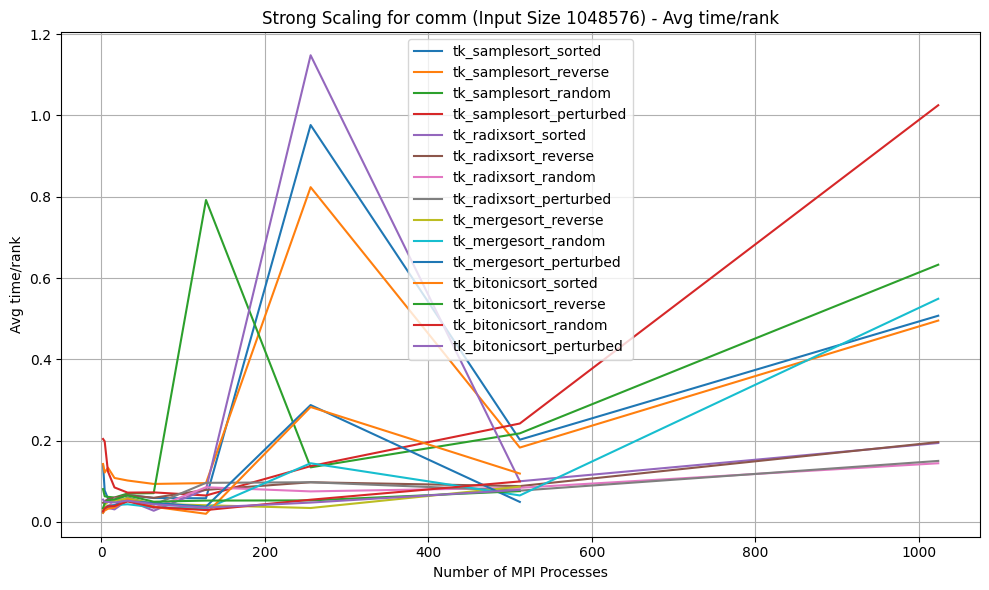

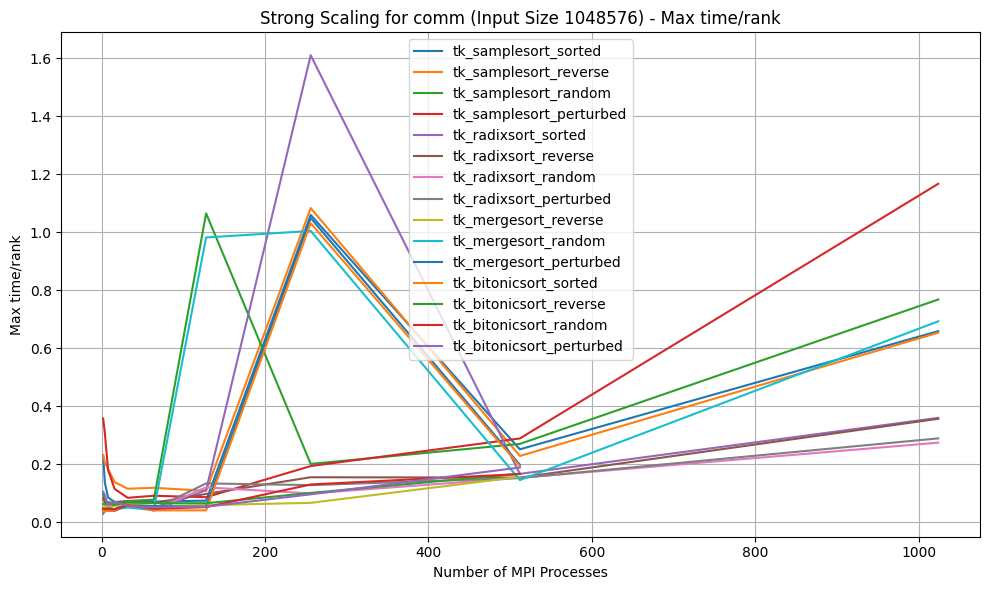

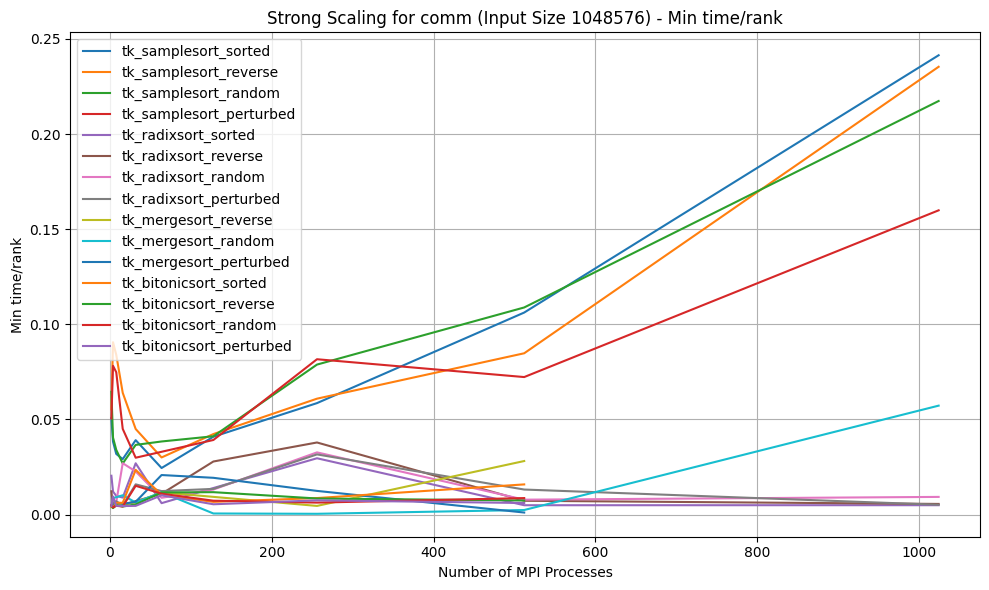

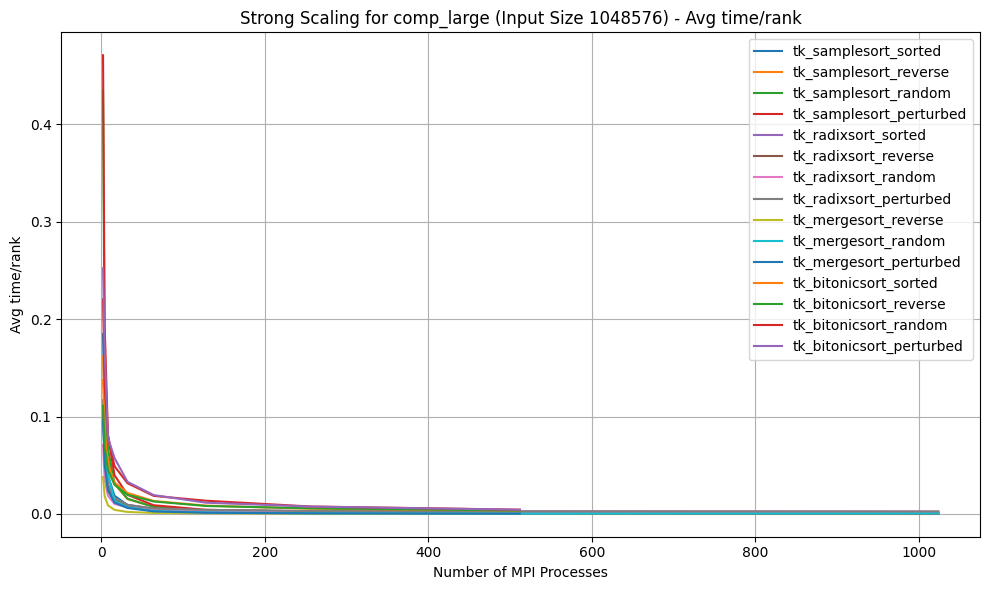

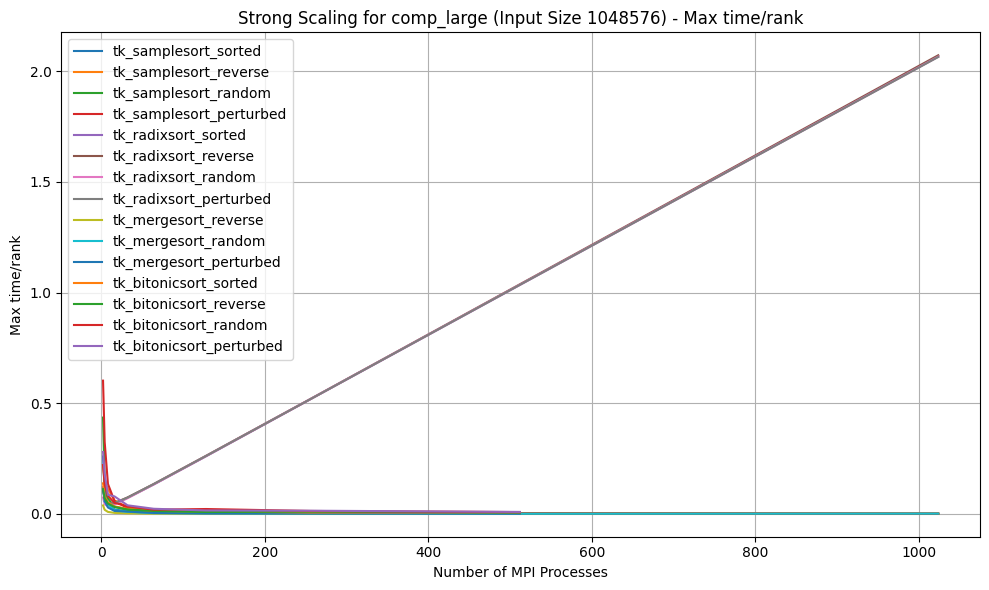

...

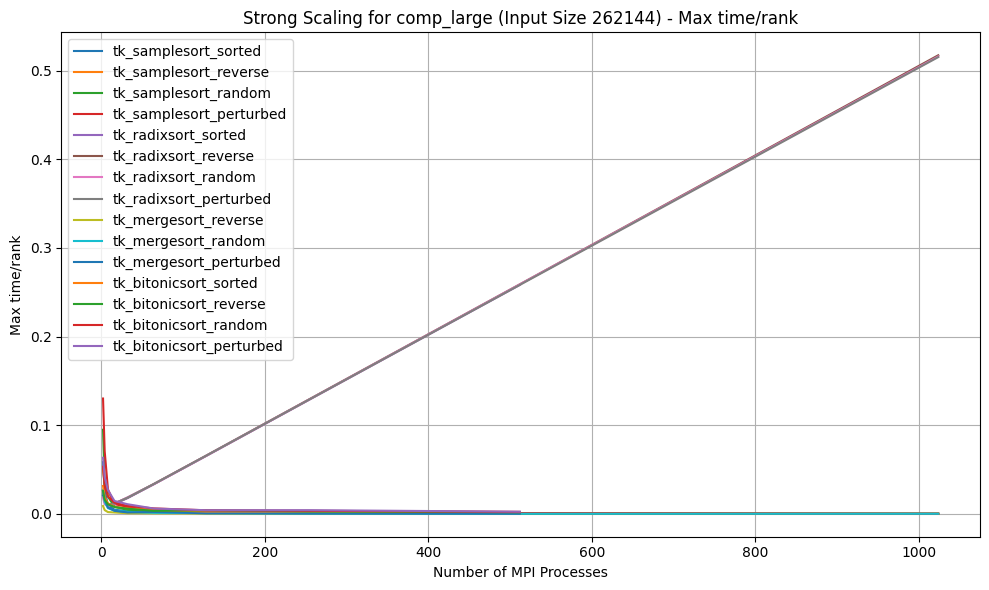

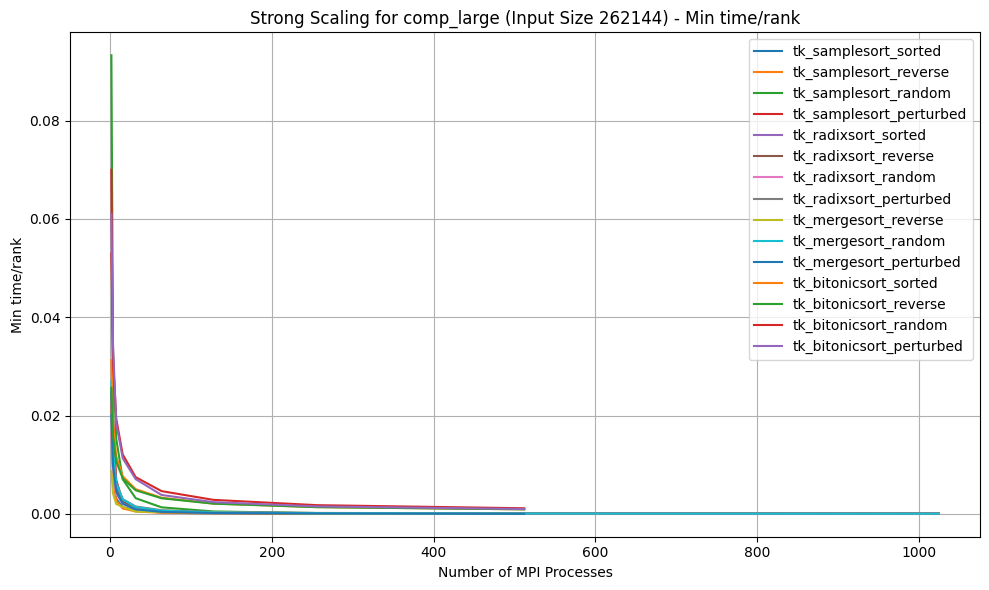

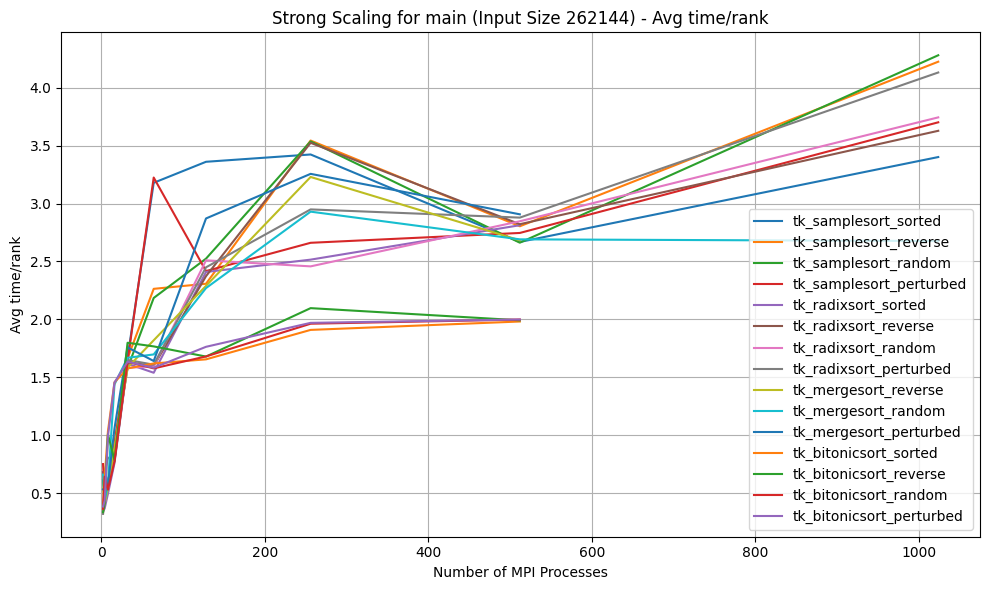

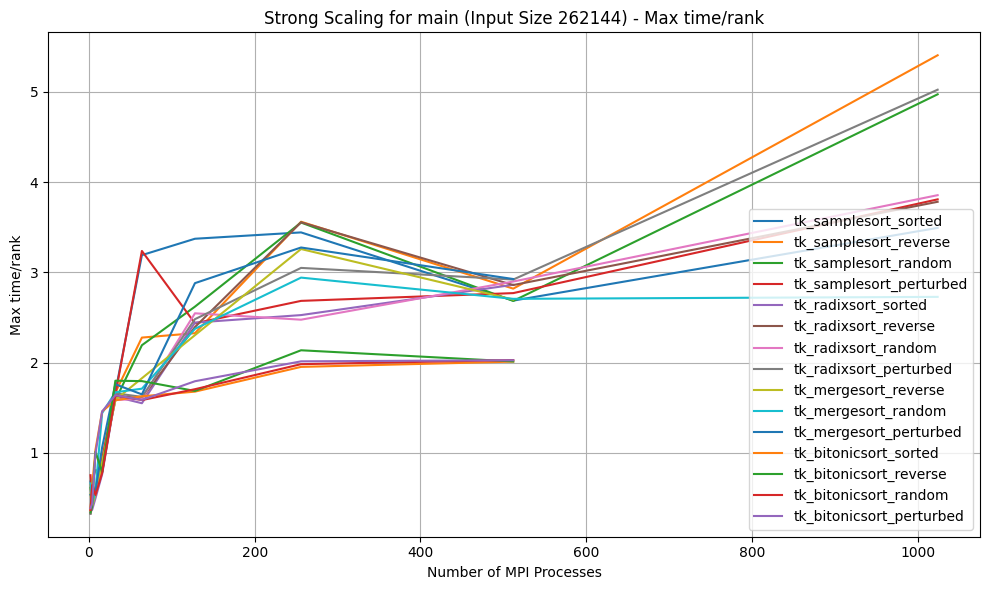

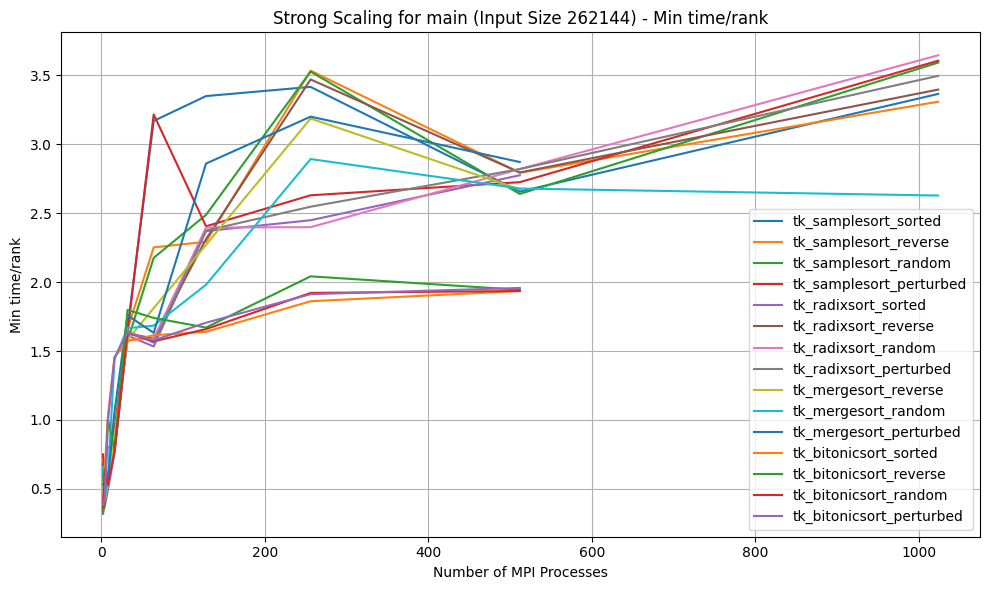

In [27]:
import os
import matplotlib.pyplot as plt

# Helper function to ensure the directory exists
def ensure_dir(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

# Function to plot strong scaling for each component and metric, with all 16 dataframes on the same plot
def plot_strong_scaling_by_component(input_size, component, metric):
    plt.figure(figsize=(10, 6))
    
    # Loop through all dataframes and plot a line for each
    for algorithm, df in dataframes.items():
        # Filter the data for the current input_size and component (name)
        subset = df[(df['input_size'] == input_size) & (df['name'] == component)]
        if not subset.empty:
            # Ensure numeric columns are used for mean calculation
            numeric_cols = subset.select_dtypes(include='number')
            aggregated_data = numeric_cols.groupby('num_procs').mean()
            plt.plot(aggregated_data.index, aggregated_data[metric], label=f'{algorithm}')
    
    # Set labels and title
    plt.xlabel('Number of MPI Processes')
    plt.ylabel(metric)
    plt.title(f'Strong Scaling for {component} (Input Size {input_size}) - {metric}')
    plt.grid(True)
    plt.legend()

    # Set output directory and file name
#     output_dir = "strong_scaling_all_algorithms"
#     ensure_dir(output_dir)  # Ensure the directory exists

    # Replace spaces and slashes in metric name to create a valid filename
    safe_metric = metric.replace(" ", "_").replace("/", "_")
    filename = os.path.join(output_dir, f"StrongScaling_{component}_InputSize_{input_size}_{safe_metric}.png")

    # Save the plot
    plt.tight_layout()
    # plt.savefig(filename)  # Save the plot as PNG file
    plt.show()
    plt.close()

# Dictionary with all 16 dataframes (replace with actual dataframes loaded from your Thicket objects)
dataframes = {
    "tk_samplesort_sorted": dataframes["tk_samplesort_sorted"],
    "tk_samplesort_reverse": dataframes["tk_samplesort_reverse"],
    "tk_samplesort_random": dataframes["tk_samplesort_random"],
    "tk_samplesort_perturbed": dataframes["tk_samplesort_perturbed"],
    "tk_radixsort_sorted": dataframes["tk_radixsort_sorted"],
    "tk_radixsort_reverse": dataframes["tk_radixsort_reverse"],
    "tk_radixsort_random": dataframes["tk_radixsort_random"],
    "tk_radixsort_perturbed": dataframes["tk_radixsort_perturbed"],
    # "tk_mergesort_sorted": dataframes["tk_mergesort_sorted"],
    "tk_mergesort_reverse": dataframes["tk_mergesort_reverse"],
    "tk_mergesort_random": dataframes["tk_mergesort_random"],
    "tk_mergesort_perturbed": dataframes["tk_mergesort_perturbed"],
    "tk_bitonicsort_sorted": dataframes["tk_bitonicsort_sorted"],
    "tk_bitonicsort_reverse": dataframes["tk_bitonicsort_reverse"],
    "tk_bitonicsort_random": dataframes["tk_bitonicsort_random"],
    "tk_bitonicsort_perturbed": dataframes["tk_bitonicsort_perturbed"]
}

# Get the unique input sizes from any dataframe (assuming input sizes are consistent across dataframes)
input_sizes = dataframes["tk_samplesort_perturbed"]['input_size'].unique()

# Loop through input sizes, components, and metrics to generate the plots with all 16 lines
for input_size in input_sizes:
    for component in components:
        for metric in metrics:
            plot_strong_scaling_by_component(input_size, component, metric)


In [35]:
# # Function to calculate speedup and plot strong scaling speedup for each component and metric
# def plot_strong_scaling_speedup_by_component(input_type, df, component, metric):
#     plt.figure(figsize=(10, 6))

#     # Unique input sizes and number of processes
#     input_sizes = df['input_size'].unique()
#     num_procs_list = df['num_procs'].unique()

#     # Calculate speedup for each input size
#     for input_size in input_sizes:
#         # Filter the data for the current input_size and component
#         subset = df[(df['input_size'] == input_size) & (df['name'] == component)].copy()

#         # Ensure that the selected metric is available and not null
#         if subset[metric].isnull().any():
#             print(f"Skipping input size {input_size} for input type {input_type} due to missing '{metric}'.")
#             continue
        
#         # Get the baseline time (for the minimum number of processes)
#         baseline_time = subset[subset['num_procs'] == min(num_procs_list)][metric].mean()

#         # Skip if baseline_time is zero or missing
#         if baseline_time == 0 or pd.isnull(baseline_time):
#             print(f"Skipping input size {input_size} for input type {input_type} due to zero or null baseline time for '{metric}'.")
#             continue

#         # Calculate speedup: baseline_time divided by the current time for each number of processes
#         subset['speedup'] = baseline_time / subset[metric]

#         # Drop duplicates based on 'num_procs' and 'input_size'
#         subset = subset.drop_duplicates(subset=['num_procs'])

#         # Plot one line per input size
#         if not subset.empty:
#             plt.plot(subset['num_procs'], subset['speedup'], label=f'Input Size: {input_size}')

#     # Set labels and title
#     plt.xlabel('Number of MPI Processes')
#     plt.ylabel('Speedup')
#     plt.title(f'Strong Scaling Speedup - {component} - {input_type} - {metric}')
#     plt.grid(True)
#     plt.legend()

#     # Save the plot
#     filename = f"{output_dir}/Speedup_{component}_{input_type}_{metric}.png"
#     ensure_dir(filename)
#     plt.savefig(filename)
#     plt.close()

# # Function to ensure the directory exists
# def ensure_dir(file_path):
#     directory = os.path.dirname(file_path)
#     if not os.path.exists(directory):
#         os.makedirs(directory)

# # Define components and metrics
# components = ['comp_large', 'comm', 'main']
# metrics = ['Min time/rank', 'Max time/rank', 'Avg time/rank']

# # Define input types and dataframes
# input_types_dataframes = {
#     'Perturbed': df_perturbed,
#     'Random': df_random,
#     'Reversed': df_reversed,
#     'Sorted': df_sorted
# }

# # Output directory for saving speedup plots
# output_dir = "scaling_plots/samplesort/strong_scaling_speedup"

# # Generate plots for each input type, component, and metric
# for input_type, df in input_types_dataframes.items():
#     for component in components:
#         for metric in metrics:
#             plot_strong_scaling_speedup_by_component(input_type, df, component, metric)


In [95]:
# import matplotlib.pyplot as plt
# import os

# # Helper function to ensure the directory exists
# def ensure_dir(directory):
#     if not os.path.exists(directory):
#         os.makedirs(directory)

# # Function to plot weak scaling with proportional increase in input size and number of processes for each component and metric
# def plot_weak_scaling_with_tuples(input_types_dataframes, component, metric):
#     plt.figure(figsize=(12, 7))

#     # Loop through each input type
#     for input_type, df in input_types_dataframes.items():
#         # Unique input sizes and number of processes
#         input_sizes = sorted(df['input_size'].unique())
#         num_procs_list = sorted(df['num_procs'].unique())

#         # Initialize lists for x-axis tuples and y-axis times
#         x_axis_labels = []
#         y_values = []

#         # Calculate weak scaling: increasing both input_size and num_procs proportionally
#         for idx, input_size in enumerate(input_sizes):
#             if idx >= len(num_procs_list):
#                 break
            
#             num_procs = num_procs_list[idx]
            
#             # Filter the data for the current input_size, num_procs, and component
#             subset = df[(df['input_size'] == input_size) & (df['num_procs'] == num_procs) & (df['name'] == component)]

#             # Check if data is available for the given metric
#             if not subset.empty and subset[metric].notnull().all():
#                 x_axis_labels.append((num_procs, input_size))  # Tuple of (num_procs, input_size)
#                 y_values.append(subset[metric].mean())

#         # Plot the results with tuples as x-axis labels
#         plt.plot(range(len(x_axis_labels)), y_values, label=input_type, marker='o')

#     # Convert the x-axis labels to tuples of (num_procs, input_size)
#     x_axis_str_labels = [f"({procs}, {size})" for procs, size in x_axis_labels]
#     plt.xticks(ticks=range(len(x_axis_str_labels)), labels=x_axis_str_labels, rotation=45)

#     # Set labels and title
#     plt.xlabel('(Number of MPI Processes, Input Size)')
#     plt.ylabel(metric)
#     plt.title(f'Weak Scaling for {component} - {metric}')
#     plt.grid(True)
#     plt.legend()

#     # Set output directory and file name
#     output_dir = "mergesort/weak_scaling"
#     # ensure_dir(output_dir)  # Ensure the directory exists

#     # Replace spaces and slashes in metric name to create a valid filename
#     safe_metric = metric.replace(" ", "_").replace("/", "_")
#     # filename = os.path.join(output_dir, f"WeakScaling_{component}_{safe_metric}.png")

#     # Save the plot
#     plt.tight_layout()
#     # plt.savefig(filename)
#     plt.show()
#     plt.close()

# # Define components, metrics, and input types
# components = ['comp_large', 'comm', 'main']
# metrics = ['Min time/rank', 'Max time/rank', 'Avg time/rank']

# # Define input types and dataframes
# input_types_dataframes = {
# #     'Perturbed': df_perturbed,
#     'Random': df_random,
#     'Reversed': df_reversed,
#     # 'Sorted': df_sorted
# }

# # Generate weak scaling plots for each component and metric
# for component in components:
#     for metric in metrics:
#         plot_weak_scaling_with_tuples(input_types_dataframes, component, metric)


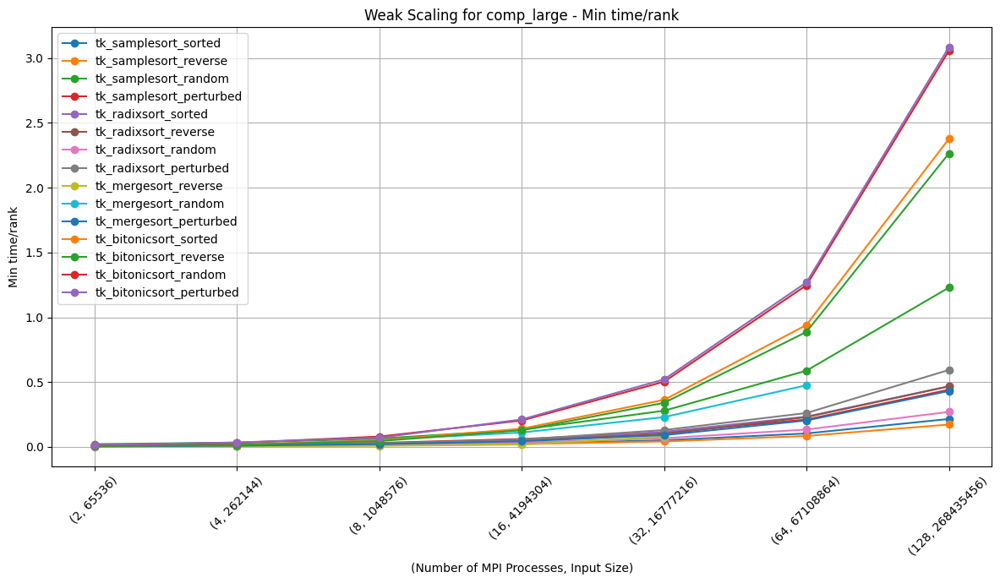

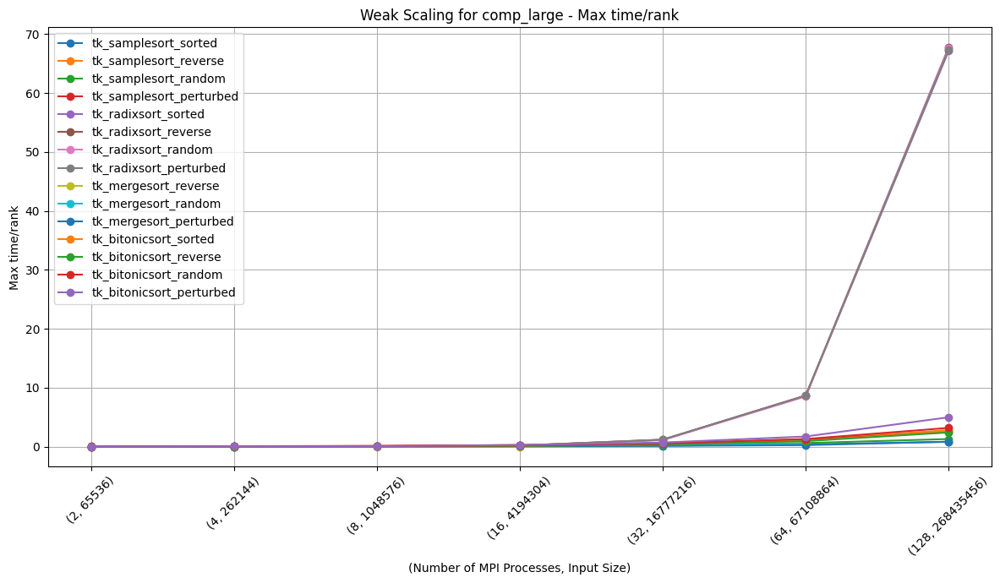

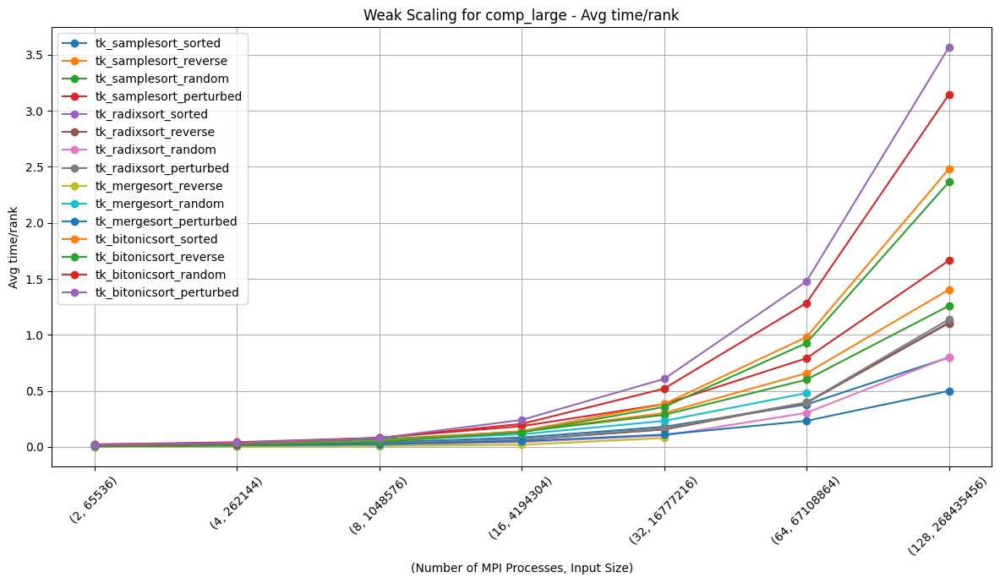

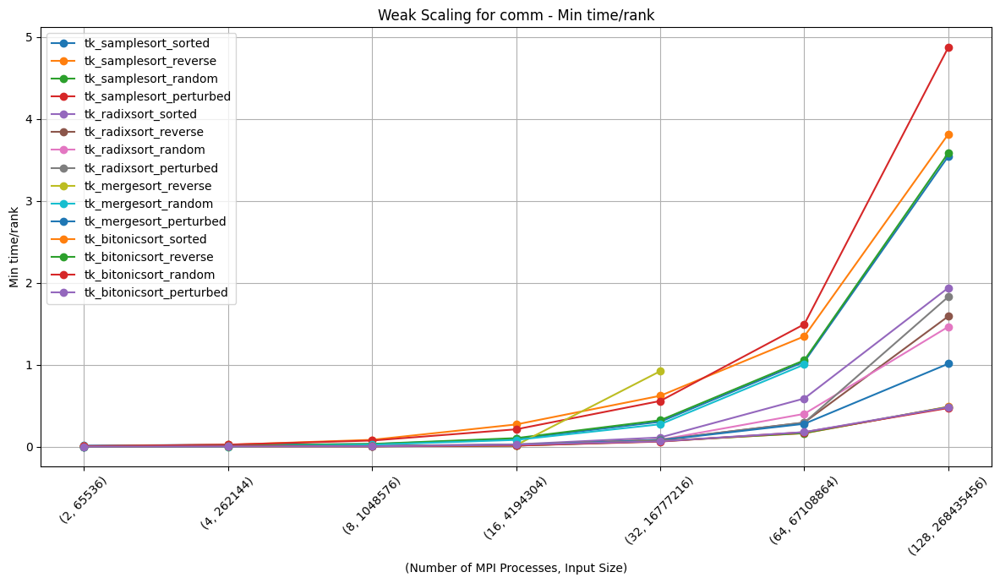

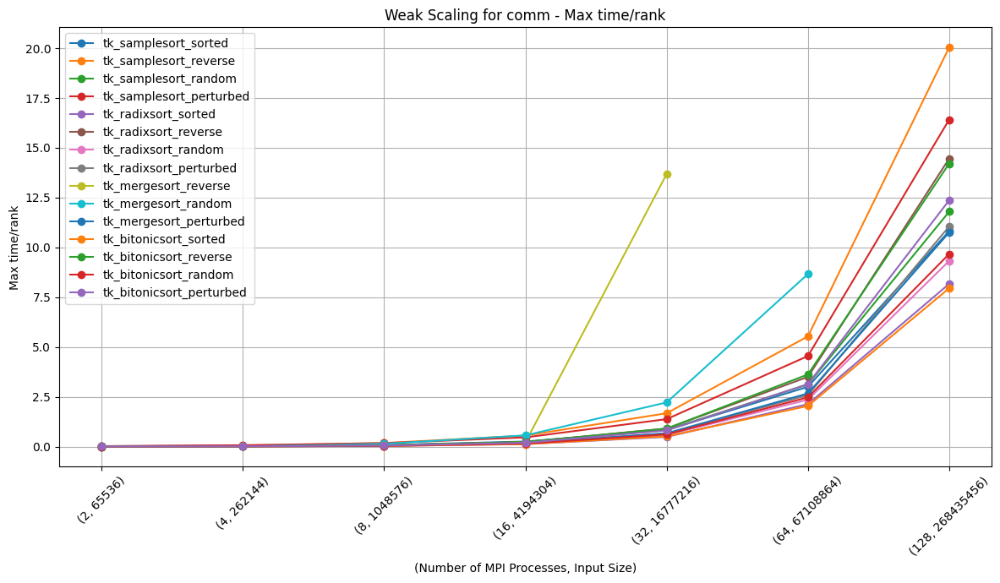

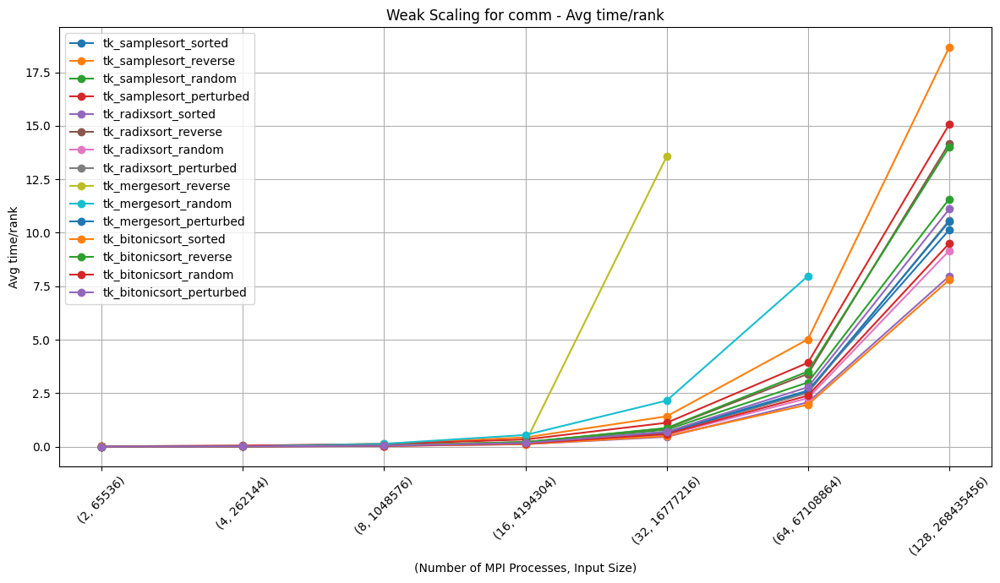

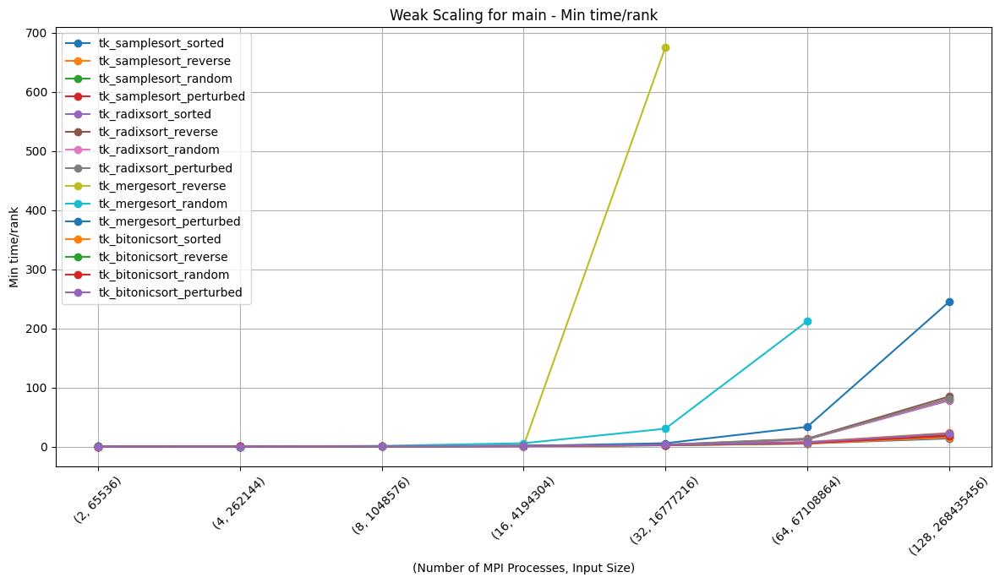

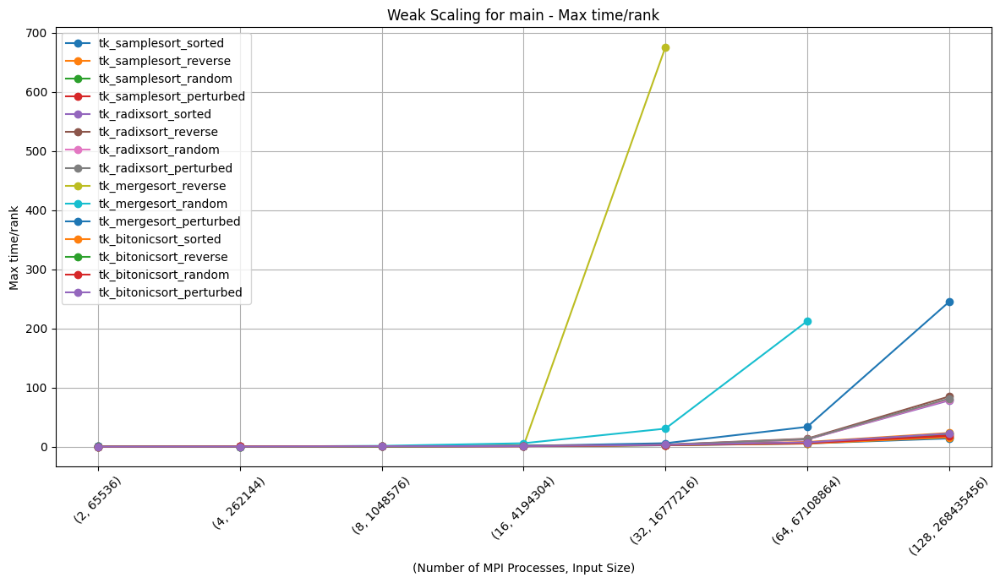

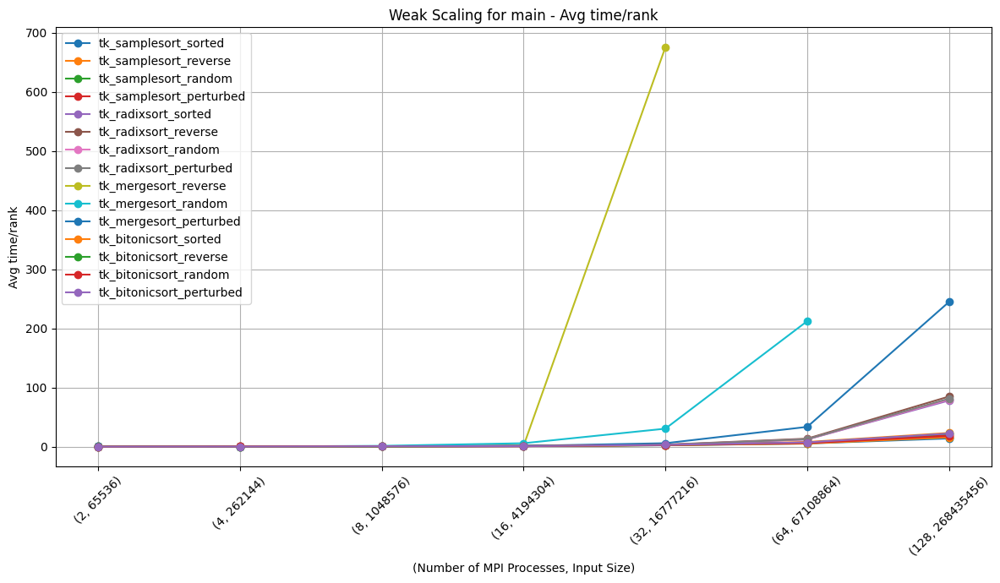

In [28]:
import matplotlib.pyplot as plt
import os

# Helper function to ensure the directory exists
def ensure_dir(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

# Function to plot weak scaling with proportional increase in input size and number of processes for each component and metric
def plot_weak_scaling_with_tuples(dataframes, component, metric):
    plt.figure(figsize=(12, 7))

    # Loop through each dataframe and plot a line for each
    for algorithm, df in dataframes.items():
        # Unique input sizes and number of processes
        input_sizes = sorted(df['input_size'].unique())
        num_procs_list = sorted(df['num_procs'].unique())

        # Initialize lists for x-axis tuples and y-axis times
        x_axis_labels = []
        y_values = []

        # Calculate weak scaling: increasing both input_size and num_procs proportionally
        for idx, input_size in enumerate(input_sizes):
            if idx >= len(num_procs_list):
                break
            
            num_procs = num_procs_list[idx]
            
            # Filter the data for the current input_size, num_procs, and component
            subset = df[(df['input_size'] == input_size) & (df['num_procs'] == num_procs) & (df['name'] == component)]

            # Check if data is available for the given metric
            if not subset.empty and subset[metric].notnull().all():
                x_axis_labels.append((num_procs, input_size))  # Tuple of (num_procs, input_size)
                y_values.append(subset[metric].mean())

        # Plot the results with tuples as x-axis labels
        plt.plot(range(len(x_axis_labels)), y_values, label=algorithm, marker='o')

    # Convert the x-axis labels to tuples of (num_procs, input_size)
    x_axis_str_labels = [f"({procs}, {size})" for procs, size in x_axis_labels]
    plt.xticks(ticks=range(len(x_axis_str_labels)), labels=x_axis_str_labels, rotation=45)

    # Set labels and title
    plt.xlabel('(Number of MPI Processes, Input Size)')
    plt.ylabel(metric)
    plt.title(f'Weak Scaling for {component} - {metric}')
    plt.grid(True)
    plt.legend()

    # Set output directory and file name
#     output_dir = "scaling_plots/weak_scaling"
#     ensure_dir(output_dir)  # Ensure the directory exists

    # Replace spaces and slashes in metric name to create a valid filename
    safe_metric = metric.replace(" ", "_").replace("/", "_")
    filename = os.path.join(output_dir, f"WeakScaling_{component}_{safe_metric}.png")

    # Save the plot
    plt.tight_layout()
    # plt.savefig(filename)
    plt.show()
    plt.close()

# Define components, metrics, and input types
components = ['comp_large', 'comm', 'main']
metrics = ['Min time/rank', 'Max time/rank', 'Avg time/rank']

# Dictionary with all 16 dataframes (replace with actual dataframes loaded from your Thicket objects)
dataframes = {
    "tk_samplesort_sorted": dataframes["tk_samplesort_sorted"],
    "tk_samplesort_reverse": dataframes["tk_samplesort_reverse"],
    "tk_samplesort_random": dataframes["tk_samplesort_random"],
    "tk_samplesort_perturbed": dataframes["tk_samplesort_perturbed"],
    "tk_radixsort_sorted": dataframes["tk_radixsort_sorted"],
    "tk_radixsort_reverse": dataframes["tk_radixsort_reverse"],
    "tk_radixsort_random": dataframes["tk_radixsort_random"],
    "tk_radixsort_perturbed": dataframes["tk_radixsort_perturbed"],
    # "tk_mergesort_sorted": dataframes["tk_mergesort_sorted"],
    "tk_mergesort_reverse": dataframes["tk_mergesort_reverse"],
    "tk_mergesort_random": dataframes["tk_mergesort_random"],
    "tk_mergesort_perturbed": dataframes["tk_mergesort_perturbed"],
    "tk_bitonicsort_sorted": dataframes["tk_bitonicsort_sorted"],
    "tk_bitonicsort_reverse": dataframes["tk_bitonicsort_reverse"],
    "tk_bitonicsort_random": dataframes["tk_bitonicsort_random"],
    "tk_bitonicsort_perturbed": dataframes["tk_bitonicsort_perturbed"]
}


# Generate weak scaling plots for each component and metric with 16 lines on each graph
for component in components:
    for metric in metrics:
        plot_weak_scaling_with_tuples(dataframes, component, metric)


In [29]:
import matplotlib.pyplot as plt
import os

# Helper function to ensure the directory exists
def ensure_dir(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

# Function to plot speedup by processor count for each input size, component, and metric
def plot_speedup_per_algorithm(dataframes, dataframe_key, component, metric):
    plt.figure(figsize=(10, 6))
    
    # Extract algorithm and input type from the dataframe key
    algorithm, input_type = dataframe_key.rsplit("_", 1)
    
    # Data for the specified dataframe (algorithm and input type combination)
    df = dataframes[dataframe_key]

    # Ensure we have data for processor count = 2
    baseline_subset = df[(df['num_procs'] == 2) & (df['name'] == component)]
    if baseline_subset.empty or baseline_subset[metric].isnull().any():
        return  # Skip this graph if no baseline data is available

    baseline_time = baseline_subset[metric].mean()  # Baseline time for processor = 2

    # Unique processor counts and input sizes
    num_procs_list = sorted(df['num_procs'].unique())
    input_sizes = sorted(df['input_size'].unique())

    # Plot speedup for each input size
    for input_size in input_sizes:
        y_values = []
        for num_procs in num_procs_list:
            subset = df[(df['input_size'] == input_size) &
                        (df['num_procs'] == num_procs) &
                        (df['name'] == component)]
            if not subset.empty and subset[metric].notnull().all():
                current_time = subset[metric].mean()
                speedup = (baseline_time / current_time) * 2
                y_values.append(speedup)
            else:
                y_values.append(None)  # Missing data point for this processor count
        
        # Plot speedup against processor count
        plt.plot(num_procs_list, y_values, label=f"Input Size {input_size}", marker='o')

    # Set labels and title
    plt.xlabel('Number of MPI Processes')
    plt.ylabel('Speedup')
    plt.title(f'Speedup for {algorithm}, {component} - {metric} ({input_type})')
    plt.grid(True)
    plt.legend()

    # Set output directory and file name
    output_dir = f"scaling_plots/speedup_plots/{component}/{metric}/{algorithm}/{input_type}"
    ensure_dir(output_dir)

    # Save the plot
    safe_metric = metric.replace(" ", "_").replace("/", "_")
    filename = os.path.join(output_dir, f"Speedup_{component}_{safe_metric}_{algorithm}_{input_type}.png")
    plt.tight_layout()
    plt.savefig(filename)
    plt.show()
    plt.close()

# Define components, metrics, and dataframes dictionary
components = ['comp_large', 'comm', 'main']
metrics = ['Min time/rank', 'Max time/rank', 'Avg time/rank']

# Flat dictionary with all dataframes using keys to identify algorithms and input types
dataframes = {
    "tk_samplesort_sorted": dataframes["tk_samplesort_sorted"],
    "tk_samplesort_reverse": dataframes["tk_samplesort_reverse"],
    "tk_samplesort_random": dataframes["tk_samplesort_random"],
    "tk_samplesort_perturbed": dataframes["tk_samplesort_perturbed"],
    "tk_radixsort_sorted": dataframes["tk_radixsort_sorted"],
    "tk_radixsort_reverse": dataframes["tk_radixsort_reverse"],
    "tk_radixsort_random": dataframes["tk_radixsort_random"],
    "tk_radixsort_perturbed": dataframes["tk_radixsort_perturbed"],
    "tk_mergesort_sorted": dataframes["tk_mergesort_sorted"],
    "tk_mergesort_reverse": dataframes["tk_mergesort_reverse"],
    "tk_mergesort_random": dataframes["tk_mergesort_random"],
    "tk_mergesort_perturbed": dataframes["tk_mergesort_perturbed"],
    "tk_bitonicsort_sorted": dataframes["tk_bitonicsort_sorted"],
    "tk_bitonicsort_reverse": dataframes["tk_bitonicsort_reverse"],
    "tk_bitonicsort_random": dataframes["tk_bitonicsort_random"],
    "tk_bitonicsort_perturbed": dataframes["tk_bitonicsort_perturbed"]
}

# Generate speedup plots for each combination
for component in components:
    for metric in metrics:
        for dataframe_key in dataframes.keys():
            plot_speedup_per_algorithm(dataframes, dataframe_key, component, metric)


KeyError: 'tk_mergesort_sorted'